<a href="https://colab.research.google.com/github/markvrma/discord-bot-sample/blob/main/pokemon_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

- Please view table of contents to navigate to your preferred section.

In [ ]:
%matplotlib inline
import scipy.stats as stats
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')
from sklearn.model_selection import train_test_split

import os
for dirname, _, filenames in os.walk("../content/drive/MyDrive/data_csv"):
    for filename in filenames:
        print(os.path.join(dirname, filename))

../content/drive/MyDrive/data_csv/Fraud.csv
../content/drive/MyDrive/data_csv/Pokemon.csv
../content/drive/MyDrive/data_csv/pokemon_analysis.ipynb


# **Initial Viewing of Data**

In [ ]:
df = pd.read_csv("../content/drive/MyDrive/data_csv/Pokemon.csv")
df.sort_index('index',100)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.sort_index will be keyword-only
  


,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,719,Diancie,Rock,Fairy,600,50,100,150,100,150,50,6,True
796,719,DiancieMega Diancie,Rock,Fairy,700,50,160,110,160,110,110,6,True
797,720,HoopaHoopa Confined,Psychic,Ghost,600,80,110,60,150,130,70,6,True
798,720,HoopaHoopa Unbound,Psychic,Dark,680,80,160,60,170,130,80,6,True


### We will replace NaN values with 0 to make our data processing easier

In [ ]:
df['Type 2'] = df['Type 2'].fillna(0)

In [ ]:
df.sort_index('index',100)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.sort_index will be keyword-only
  """Entry point for launching an IPython kernel.


,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,4,Charmander,Fire,0,309,39,52,43,60,50,65,1,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,719,Diancie,Rock,Fairy,600,50,100,150,100,150,50,6,True
796,719,DiancieMega Diancie,Rock,Fairy,700,50,160,110,160,110,110,6,True
797,720,HoopaHoopa Confined,Psychic,Ghost,600,80,110,60,150,130,70,6,True
798,720,HoopaHoopa Unbound,Psychic,Dark,680,80,160,60,170,130,80,6,True


In [ ]:
print('This data frame has {} rows and {} columns.'.format(df.shape[0], df.shape[1]))
df.info()

This data frame has 800 rows and 13 columns.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800 entries, 0 to 799
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   #           800 non-null    int64 
 1   Name        800 non-null    object
 2   Type 1      800 non-null    object
 3   Type 2      800 non-null    object
 4   Total       800 non-null    int64 
 5   HP          800 non-null    int64 
 6   Attack      800 non-null    int64 
 7   Defense     800 non-null    int64 
 8   Sp. Atk     800 non-null    int64 
 9   Sp. Def     800 non-null    int64 
 10  Speed       800 non-null    int64 
 11  Generation  800 non-null    int64 
 12  Legendary   800 non-null    bool  
dtypes: bool(1), int64(9), object(3)
memory usage: 75.9+ KB


### Finding out number of Pokemon with no Type 2

In [ ]:
count = (df['Type 2'] == 0).sum()
print('Number of Pokemon with no Type 2 : ', count)
print('Percentage of Pokemon with no type 2 : ', (count/800) * 100)

Number of Pokemon with no Type 2 :  386
Percentage of Pokemon with no type 2 :  48.25


- From the above data we see that almost half the pokemon have no Type 2

## Let us look at general information about the data

In [ ]:
df.describe()

,#,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation
count,800.000000,800.00000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.00000
mean,362.813750,435.10250,69.258750,79.001250,73.842500,72.820000,71.902500,68.277500,3.32375
std,208.343798,119.96304,25.534669,32.457366,31.183501,32.722294,27.828916,29.060474,1.66129
min,1.000000,180.00000,1.000000,5.000000,5.000000,10.000000,20.000000,5.000000,1.00000
25%,184.750000,330.00000,50.000000,55.000000,50.000000,49.750000,50.000000,45.000000,2.00000
50%,364.500000,450.00000,65.000000,75.000000,70.000000,65.000000,70.000000,65.000000,3.00000
75%,539.250000,515.00000,80.000000,100.000000,90.000000,95.000000,90.000000,90.000000,5.00000
max,721.000000,780.00000,255.000000,190.000000,230.000000,194.000000,230.000000,180.000000,6.00000


- By looking at the 25, 50, 75 percentiles and max we can definitely conclude that there are a few strong outliers in the pokemon 
- Eg. While 75% of pokemon have special defence and defence less than 90 there are pokemon that have max defence of 230 and max special defence of 230 (More than double the 75% and triple the average value)

In [ ]:
df.groupby('Type 1')['Total','HP','Attack','Defense', 'Sp. Atk', 'Sp. Def', 'Speed'].mean().reset_index()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


,Type 1,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed
0,Bug,378.927536,56.884058,70.971014,70.724638,53.869565,64.797101,61.681159
1,Dark,445.741935,66.806452,88.387097,70.225806,74.645161,69.516129,76.161290
2,Dragon,550.531250,83.312500,112.125000,86.375000,96.843750,88.843750,83.031250
3,Electric,443.409091,59.795455,69.090909,66.295455,90.022727,73.704545,84.500000
4,Fairy,413.176471,74.117647,61.529412,65.705882,78.529412,84.705882,48.588235
5,Fighting,416.444444,69.851852,96.777778,65.925926,53.111111,64.703704,66.074074
6,Fire,458.076923,69.903846,84.769231,67.769231,88.980769,72.211538,74.442308
7,Flying,485.000000,70.750000,78.750000,66.250000,94.250000,72.500000,102.500000
8,Ghost,439.562500,64.437500,73.781250,81.187500,79.343750,76.468750,64.343750
9,Grass,421.142857,67.271429,73.214286,70.800000,77.500000,70.428571,61.928571


## **Considering Only Type 1**

### we will have to see if having two types gives a significant advantage

IN GENERAL
* strongest type is dragon
* weakest type is bug

### Looking at overall Mean Values

* highest hp is dragon
* weakest hp is bug  


* strongest attack is dragon by a wide margin
* weakest attack is fairy  


* strongest defence is steel
* weakest defence is Normal


* strongest special attack is psychic
* weakest is fighting


* strongest special defence is dragon
* weakest special defence is bug


* highest speed is flying
* lowest speed is steel with rock in close second

# **CORRELATION MATRIX**

In [ ]:
col1 = ['Type 1', 'HP', 'Attack', 'Defense', 'Sp. Atk', 'Sp. Def', 'Speed','Legendary']

In [ ]:
df.loc[:,col1].corr()

,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Legendary
HP,1.000000,0.422386,0.239622,0.362380,0.378718,0.175952,0.273620
Attack,0.422386,1.000000,0.438687,0.396362,0.263990,0.381240,0.345408
Defense,0.239622,0.438687,1.000000,0.223549,0.510747,0.015227,0.246377
Sp. Atk,0.362380,0.396362,0.223549,1.000000,0.506121,0.473018,0.448907
Sp. Def,0.378718,0.263990,0.510747,0.506121,1.000000,0.259133,0.363937
Speed,0.175952,0.381240,0.015227,0.473018,0.259133,1.000000,0.326715
Legendary,0.273620,0.345408,0.246377,0.448907,0.363937,0.326715,1.000000


 ## Correlation Matrix for all Pokemon

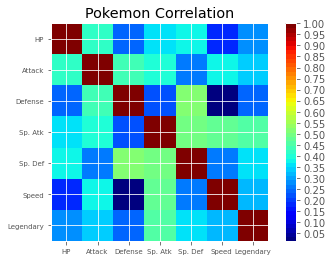

In [ ]:
# for better understanding
from matplotlib import pyplot as plt
from matplotlib import cm as cm

def correlation_matrix(df):
    fig = plt.figure()
    ax1 = fig.add_subplot(111)
    cmap = cm.get_cmap('jet', 50)
    cax = ax1.imshow(df.corr(), interpolation="nearest", cmap=cmap)
    ax1.grid(True)
    plt.title('Pokemon Correlation')
    labels=['Type 1','HP', 'Attack', 'Defense', 'Sp. Atk', 'Sp. Def', 'Speed', 'Legendary']
    ax1.set_xticklabels(labels,fontsize=7)
    ax1.set_yticklabels(labels,fontsize=7)
    fig.colorbar(cax, ticks=[0.00,.05,.10,.15,.20,.25,.30,.35,.40,.45,.50,.55,.60,.65,.70,.75,.8,.85,.90,.95,1])
    plt.show()

correlation_matrix(df.loc[:,col1])

We see that that there is a correlation between 
* Special defence and Defence
* Special defence and Special attack
* Possible correlation between Legendary Status and Special Attack
* Almost no correlation between defence and speed

## For pokemon with only Type 1

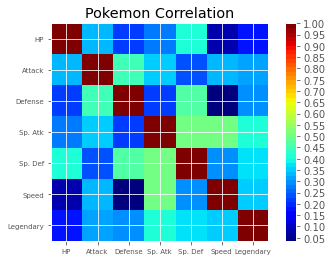

In [ ]:
col2 = ['Type 1', 'HP', 'Attack', 'Defense', 'Sp. Atk', 'Sp. Def', 'Speed','Legendary']
tempdf = df[ df['Type 2'] == 0]
from matplotlib import pyplot as plt
from matplotlib import cm as cm

def correlation_matrix(df):
    fig = plt.figure()
    ax1 = fig.add_subplot(111)
    cmap = cm.get_cmap('jet', 50)
    cax = ax1.imshow(df.corr(), interpolation="nearest", cmap=cmap)
    ax1.grid(True)
    plt.title('Pokemon Correlation')
    labels=['Type 1','HP', 'Attack', 'Defense', 'Sp. Atk', 'Sp. Def', 'Speed', 'Legendary']
    ax1.set_xticklabels(labels,fontsize=7)
    ax1.set_yticklabels(labels,fontsize=7)
    fig.colorbar(cax, ticks=[0.00,.05,.10,.15,.20,.25,.30,.35,.40,.45,.50,.55,.60,.65,.70,.75,.8,.85,.90,.95,1])
    plt.show()

correlation_matrix(tempdf.loc[:,col2])

## For pokemon with both Type 1 and Type 2

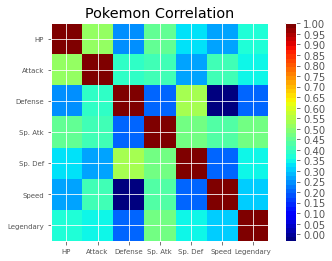

In [ ]:
col3 = ['Type 1', 'HP', 'Attack', 'Defense', 'Sp. Atk', 'Sp. Def', 'Speed','Legendary']
tempdf = df[ df['Type 2'] != 0]
from matplotlib import pyplot as plt
from matplotlib import cm as cm

def correlation_matrix(df):
    fig = plt.figure()
    ax1 = fig.add_subplot(111)
    cmap = cm.get_cmap('jet', 50)
    cax = ax1.imshow(df.corr(), interpolation="nearest", cmap=cmap)
    ax1.grid(True)
    plt.title('Pokemon Correlation')
    labels=['Type 1','HP', 'Attack', 'Defense', 'Sp. Atk', 'Sp. Def', 'Speed', 'Legendary']
    ax1.set_xticklabels(labels,fontsize=7)
    ax1.set_yticklabels(labels,fontsize=7)
    fig.colorbar(cax, ticks=[0.00,.05,.10,.15,.20,.25,.30,.35,.40,.45,.50,.55,.60,.65,.70,.75,.8,.85,.90,.95,1])
    plt.show()

correlation_matrix(tempdf.loc[:,col3])

We can see that Pokemon with Type 1 and Type 2 have correlation between:

* HP and attack
* Defence and Special Defence
* Almost no correlation between defence and speed

By Comparing the above 2 Figures we see that pokemons with both type 1 and 2 tend to be more well rounded overall (If their HP increases they will also most likely become better attackers) however that is not the case with Type 2 

## **Comparing Pokemons Based on their Types**

In [ ]:
col = ['Type 1','HP', 'Attack', 'Defense', 'Sp. Atk', 'Sp. Def', 'Speed']


### Based on individual Type one

['Grass' 'Fire' 'Water' 'Bug' 'Normal' 'Poison' 'Electric' 'Ground'
 'Fairy' 'Fighting' 'Psychic' 'Rock' 'Ghost' 'Ice' 'Dragon' 'Dark' 'Steel'
 'Flying']


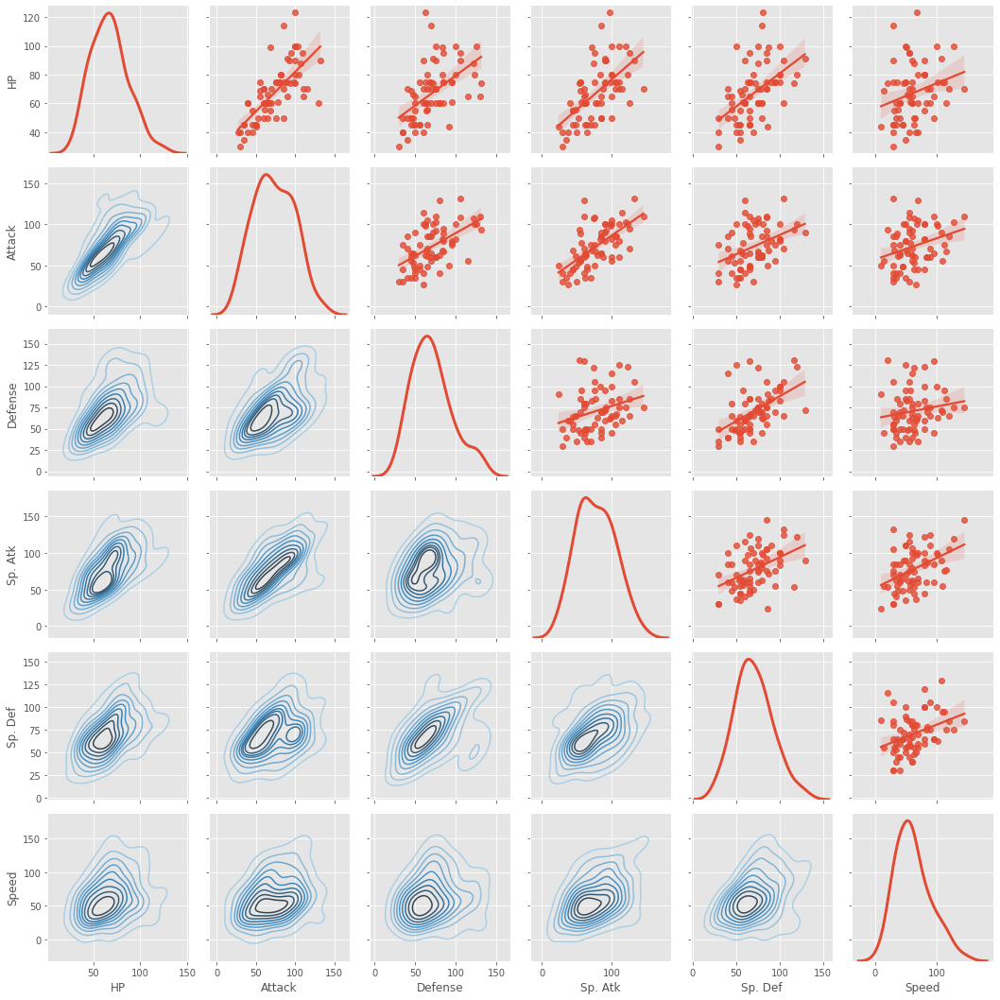

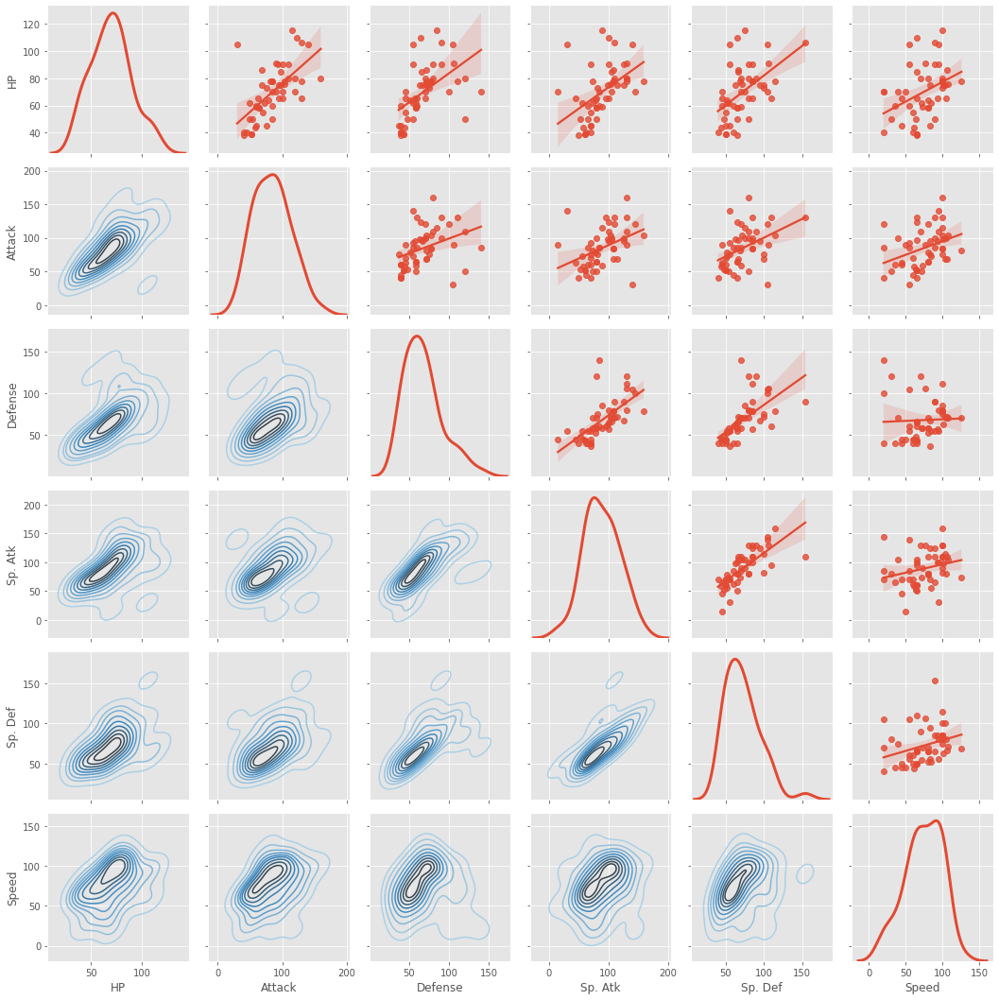

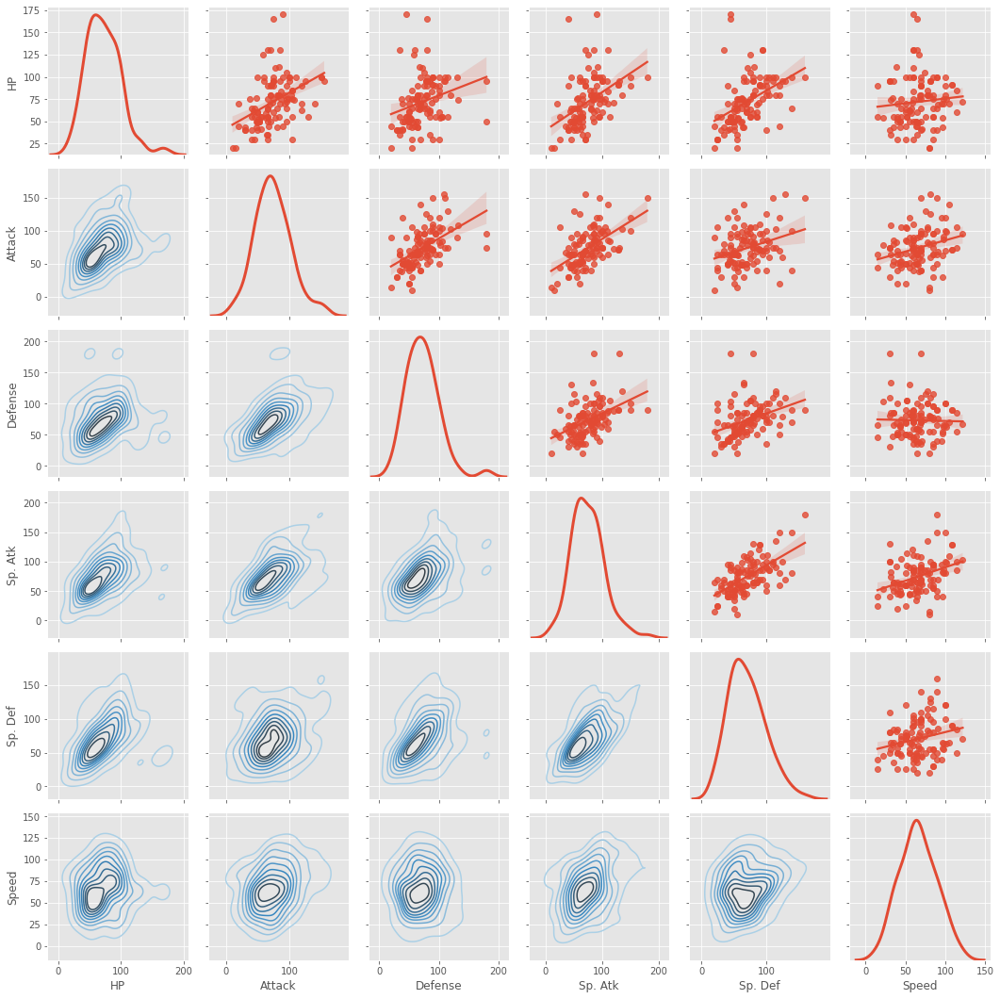

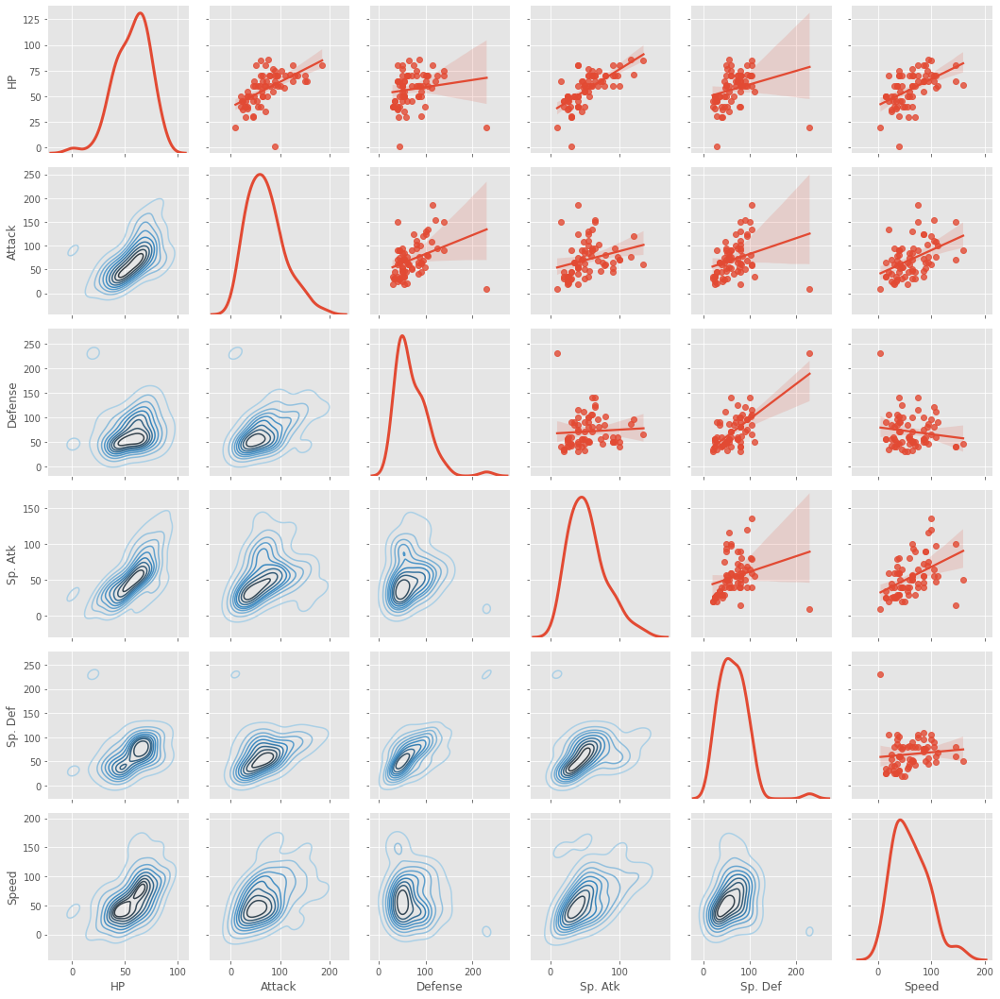

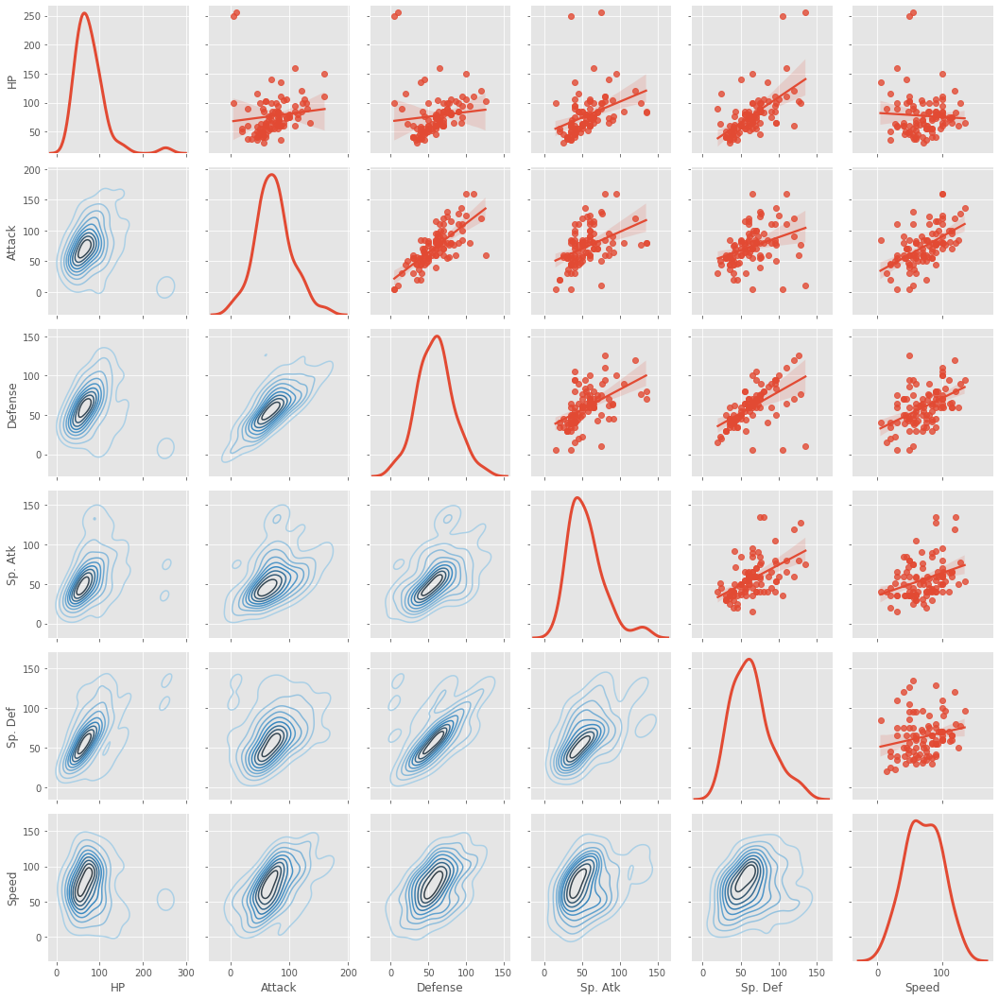

...

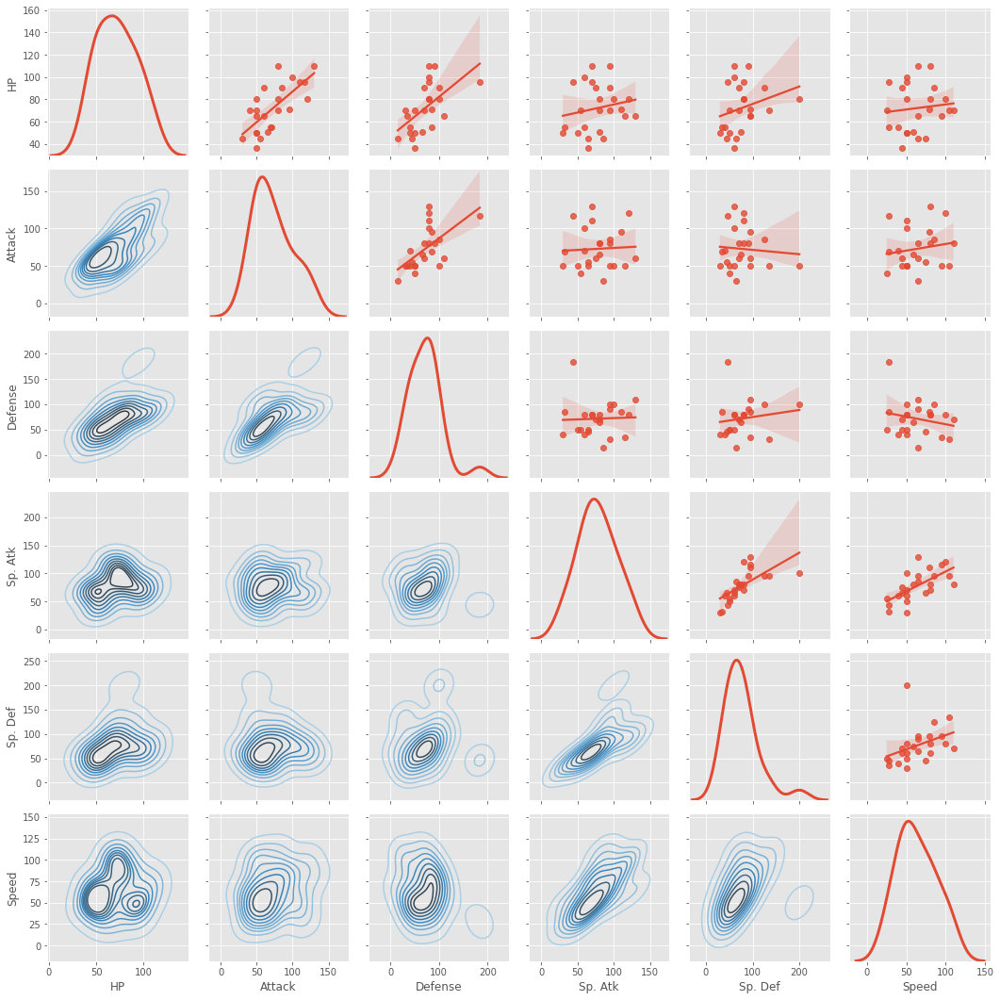

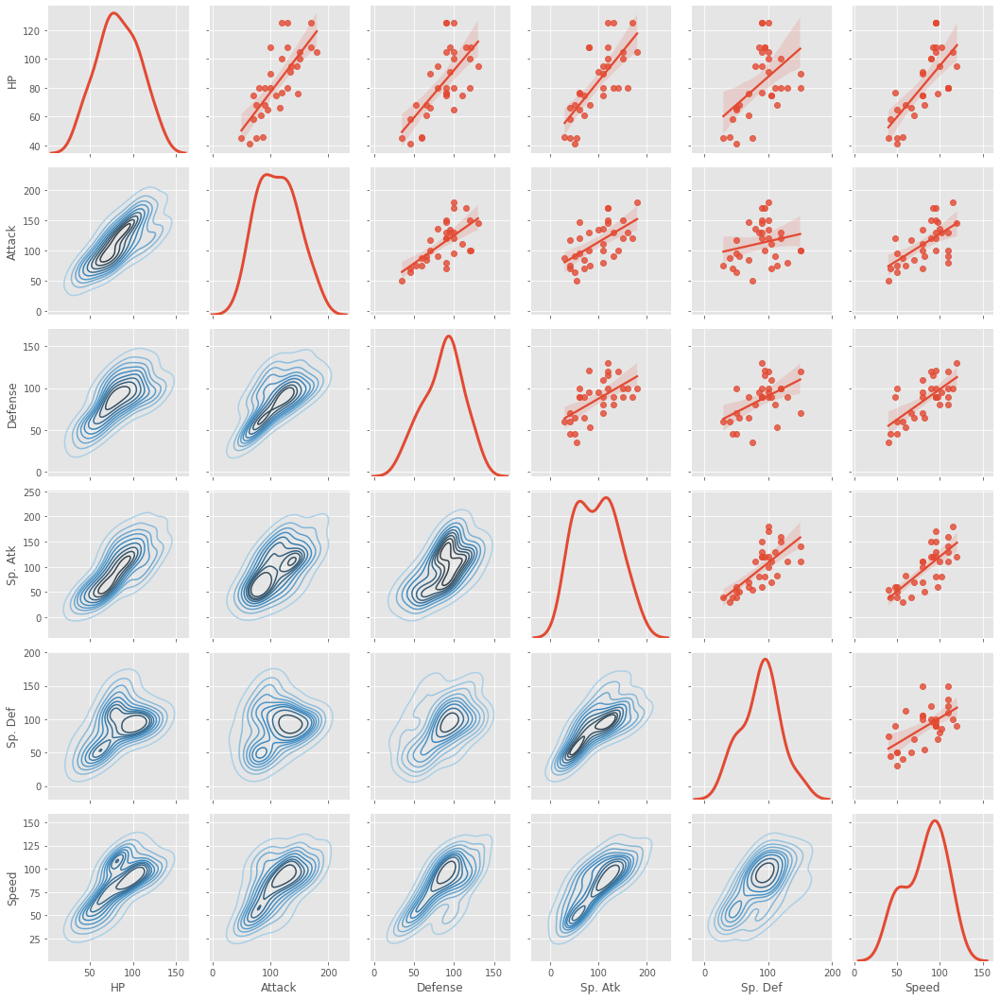

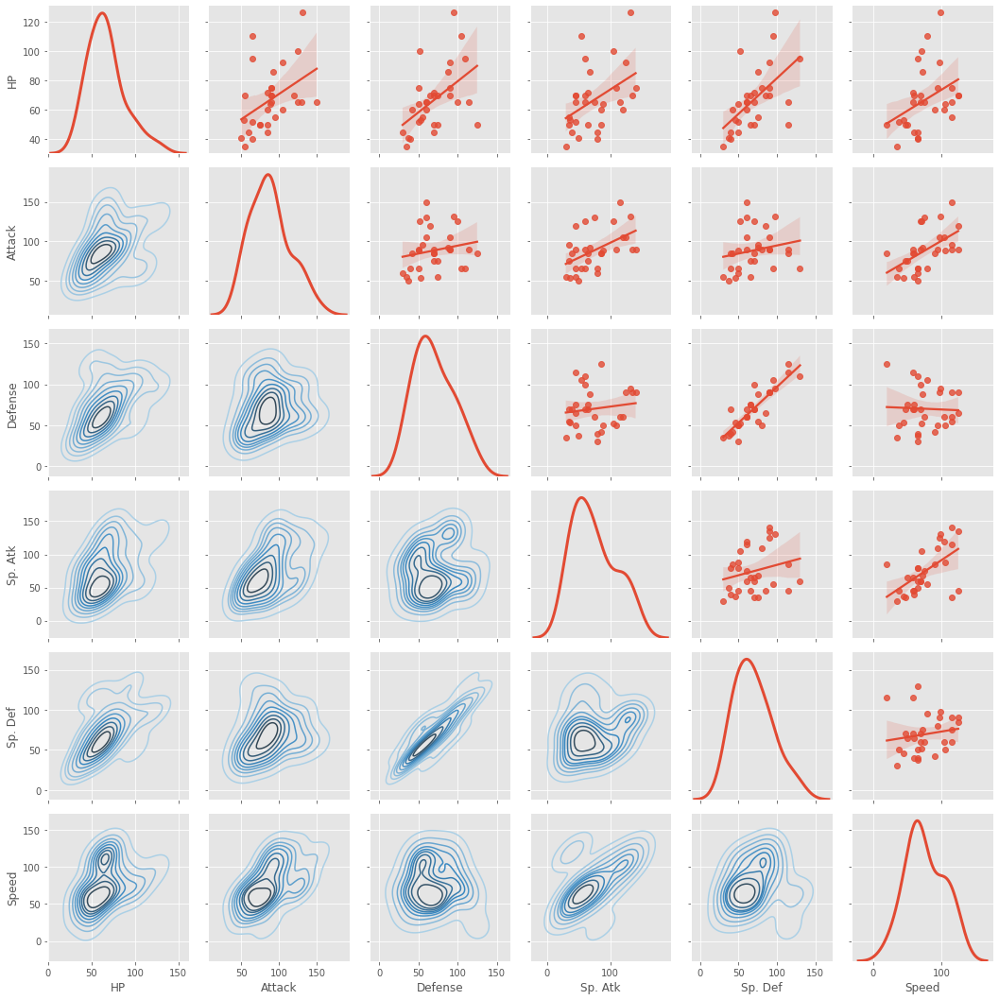

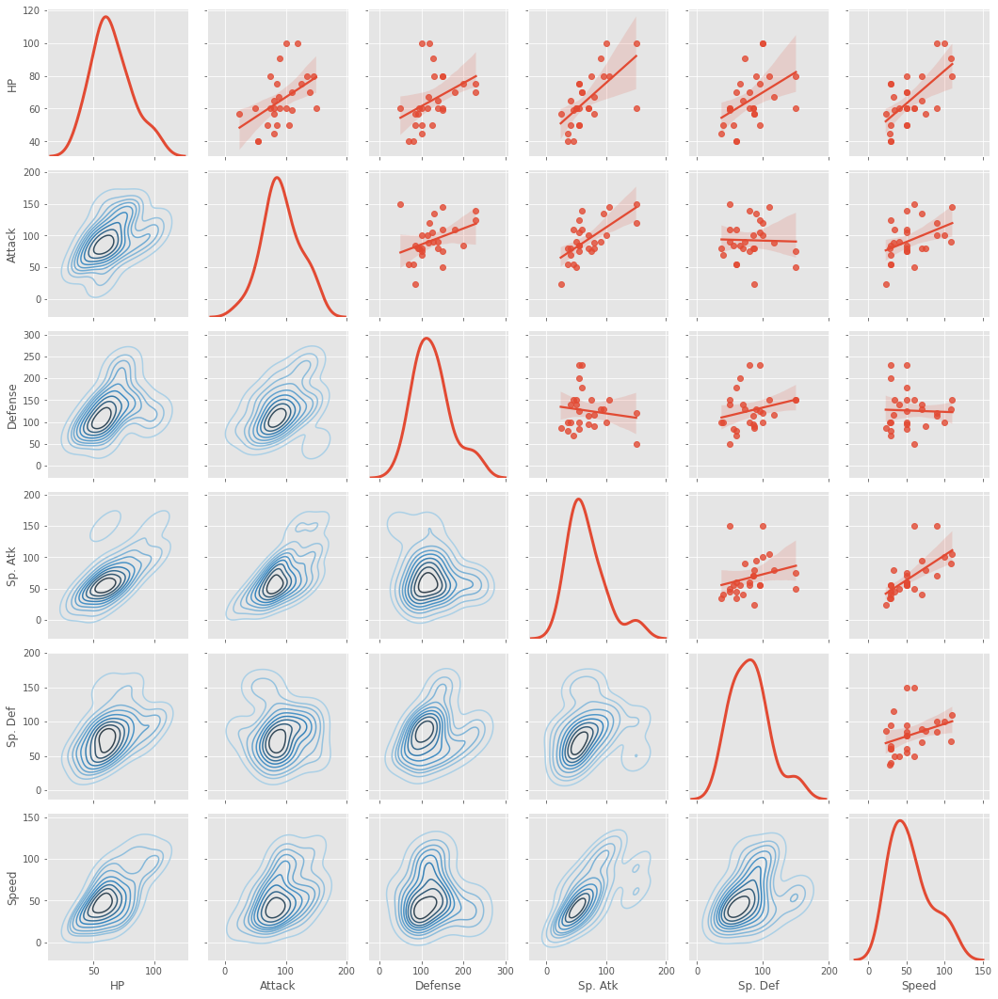

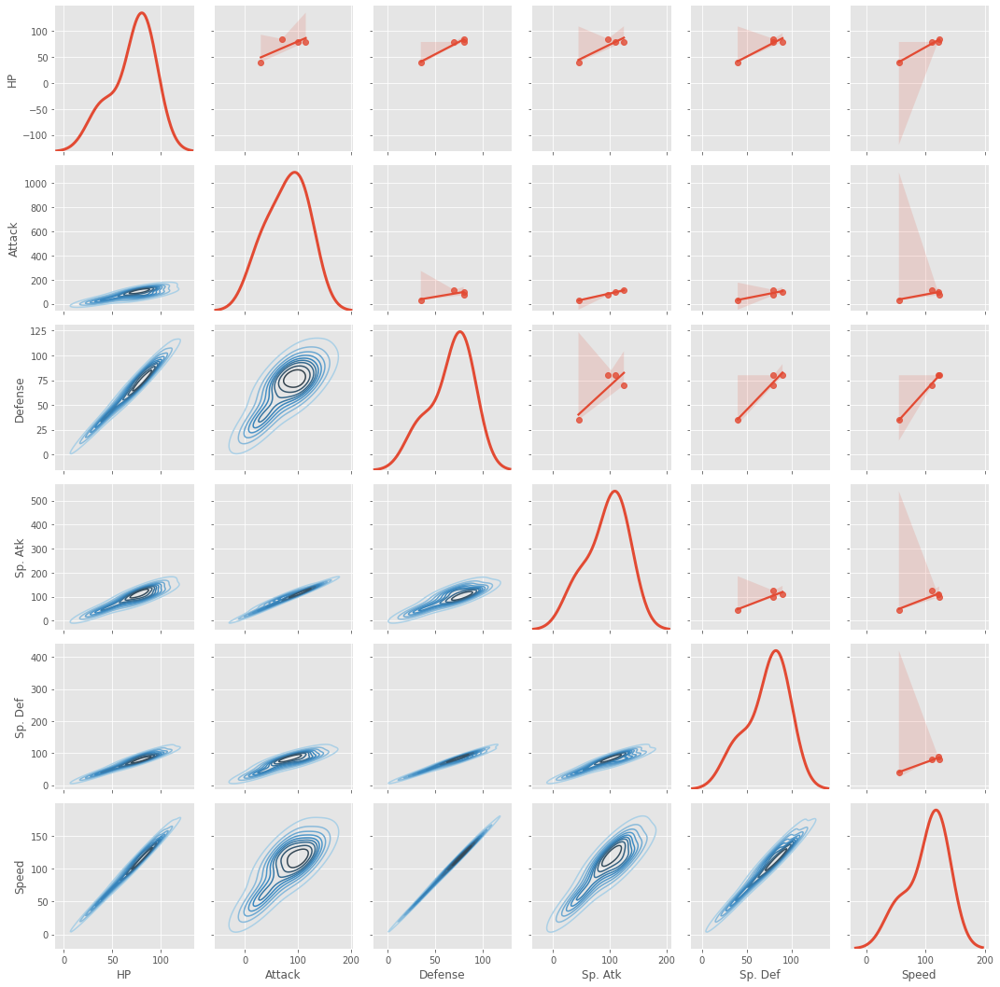

In [ ]:
# plotting for each individual type 1
import matplotlib.pyplot as plt

uniqueList = df['Type 1'].unique()
print(uniqueList)
for unique in uniqueList:
  tempdf = df[ df['Type 1'] == unique]
  g = sns.PairGrid(tempdf.loc[:,col], diag_sharey=False)
  g.map_lower(sns.kdeplot, cmap="Blues_d")
  g.map_upper(sns.regplot)
  g.map_diag(sns.kdeplot, lw=3)


This is extra information. Most of this is summarised in the conclusion
- Grass - Nothing remarkable
	- very high correlation between HP and Attack
	- correlation between HP and defense, HP and sp.attack, HP and special defence
	- density tends to skew towards left
- Fire - Nothing remarkable
	- Particularly high correlation between HP and attack here too
	- 2D density Graphs are spread out more than usual meaning our general observations will have greater differences
	- Density tends to skew left
- Water - Nothing remarkable
	- Nothing too different from general 
	- there are far more outliers compared to other types
- Bug - below average
	- correlation between speed and special attack, however we will need more bug types to confirm this
	- Suprisingly Almost no correlation between defence and special attack
	-  somewhat negative correlation between defence and speed
- Normal - Nothing remarkable
	- High correlation between attack and defense
	- negative correlation between HP and speed
- Poison - Nothing remarkable
	- Data is sparse so hard to draw concrete conclusions
	- However seems to follow the general observations
- Electric - Interesting
	- High correlation between HP and attack as well as HP and special attack
- Ground - Interesting
	- 2D density graphs have values tending to concentrate at 2 different points
- Fairy - Interesting
	- data is quite sparse, however there seems to be a correlation between speed and other factors
- Fighting - Nothing Remarkable
	- data is sparse unable to draw definite conclusions
- Psychic - Interesting
	- very high correlation between defence and special defence
- Rock - 
	- negative correlation between defence and speed
- Ghost - Interesting
	- there seem to be outliers with high HP
- Ice - Nothing remarkable
	- nothing special
- Dragon - Interesting
	- Very high positive correlation with multiple factors including speed(This is the only time this happens in this data set)
- Dark
	- Nothing not seen before
- Flying 
	- Data is quiet sparse

### Based on individual Type two

['Poison' nan 'Flying' 'Dragon' 'Ground' 'Fairy' 'Grass' 'Fighting'
 'Psychic' 'Steel' 'Ice' 'Rock' 'Dark' 'Water' 'Electric' 'Fire' 'Ghost'
 'Bug' 'Normal']


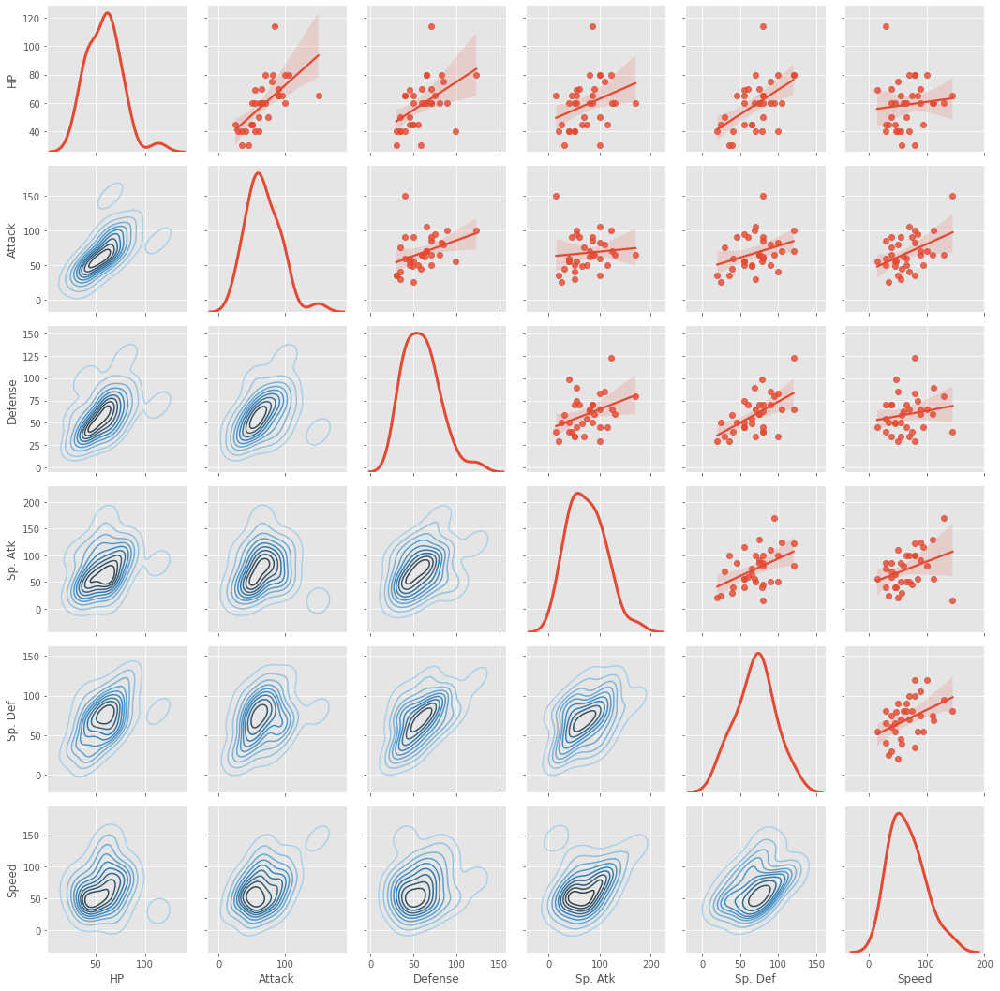

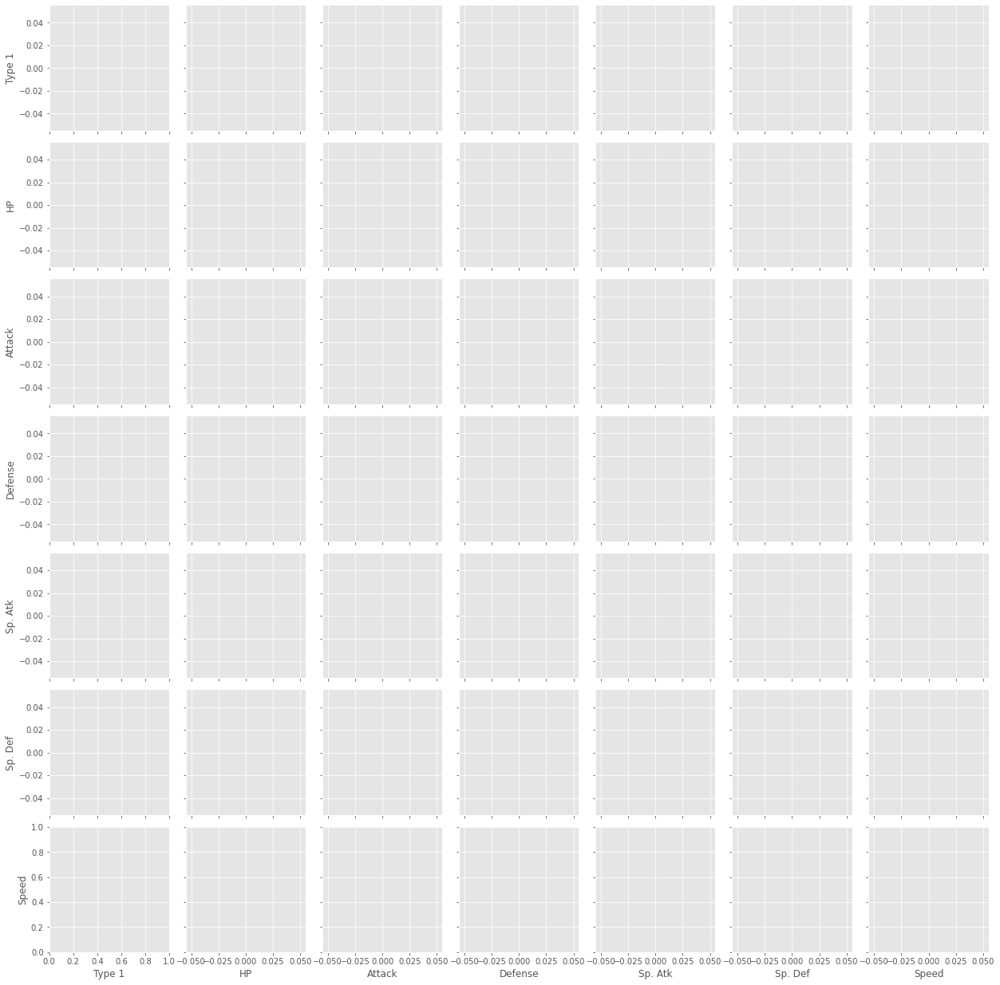

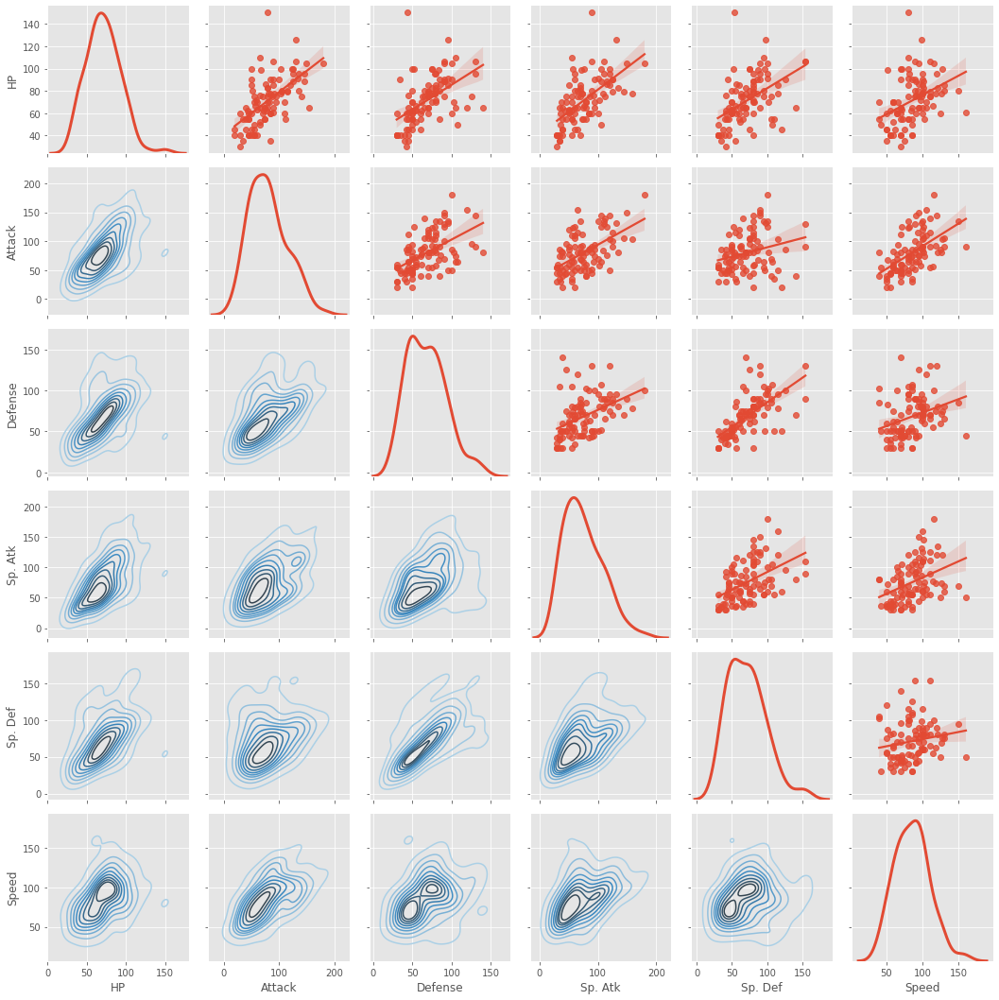

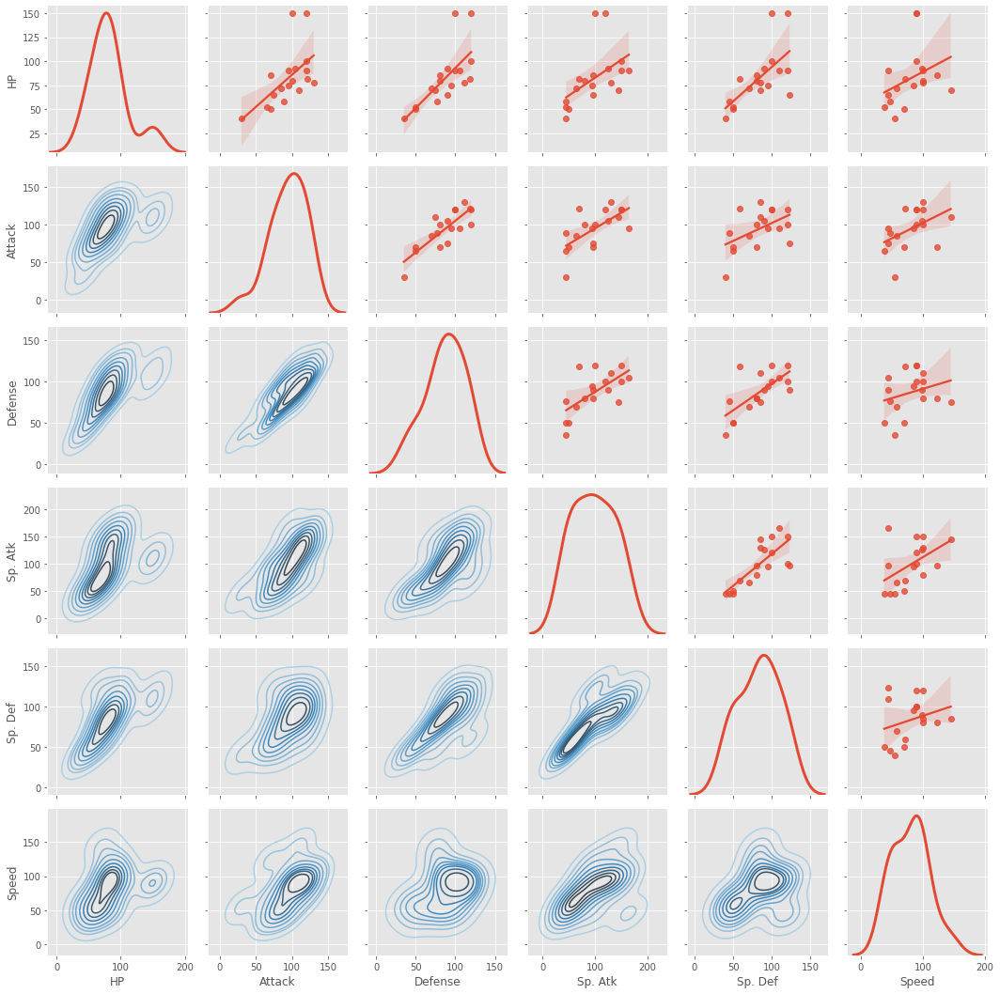

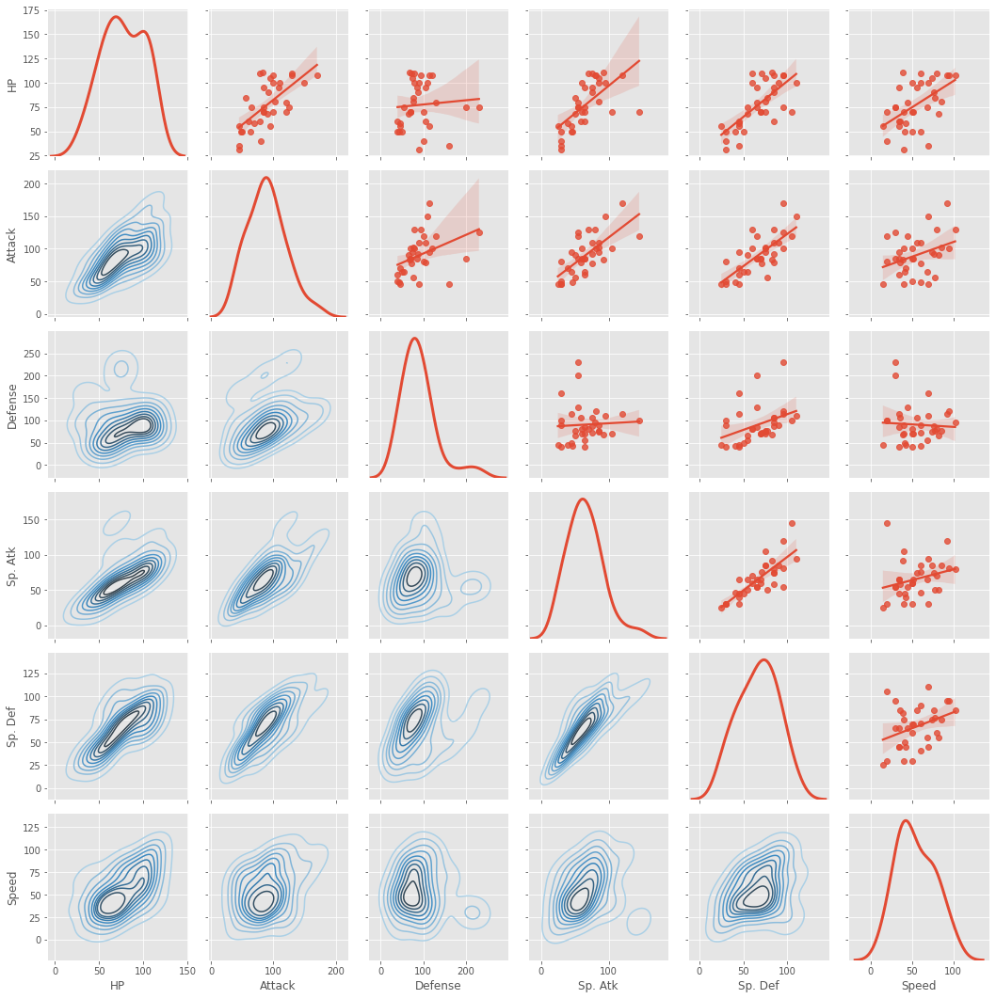

...

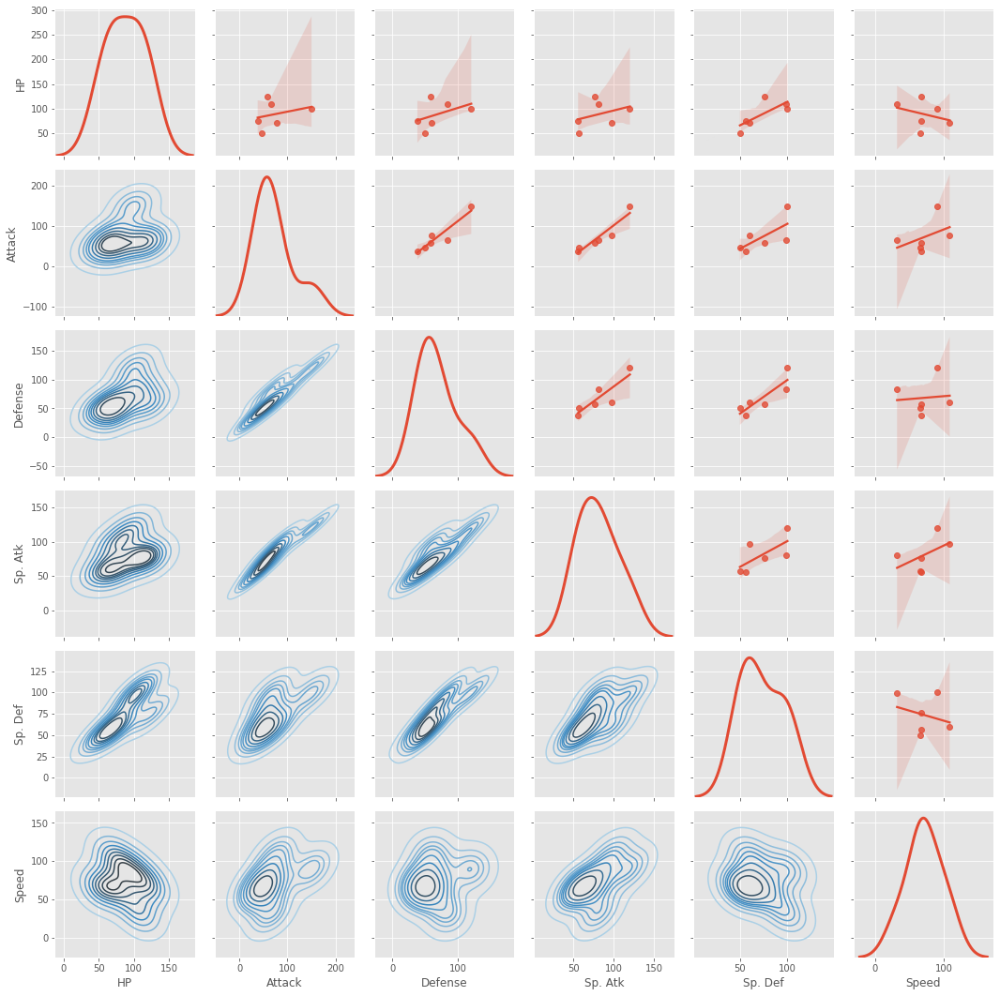

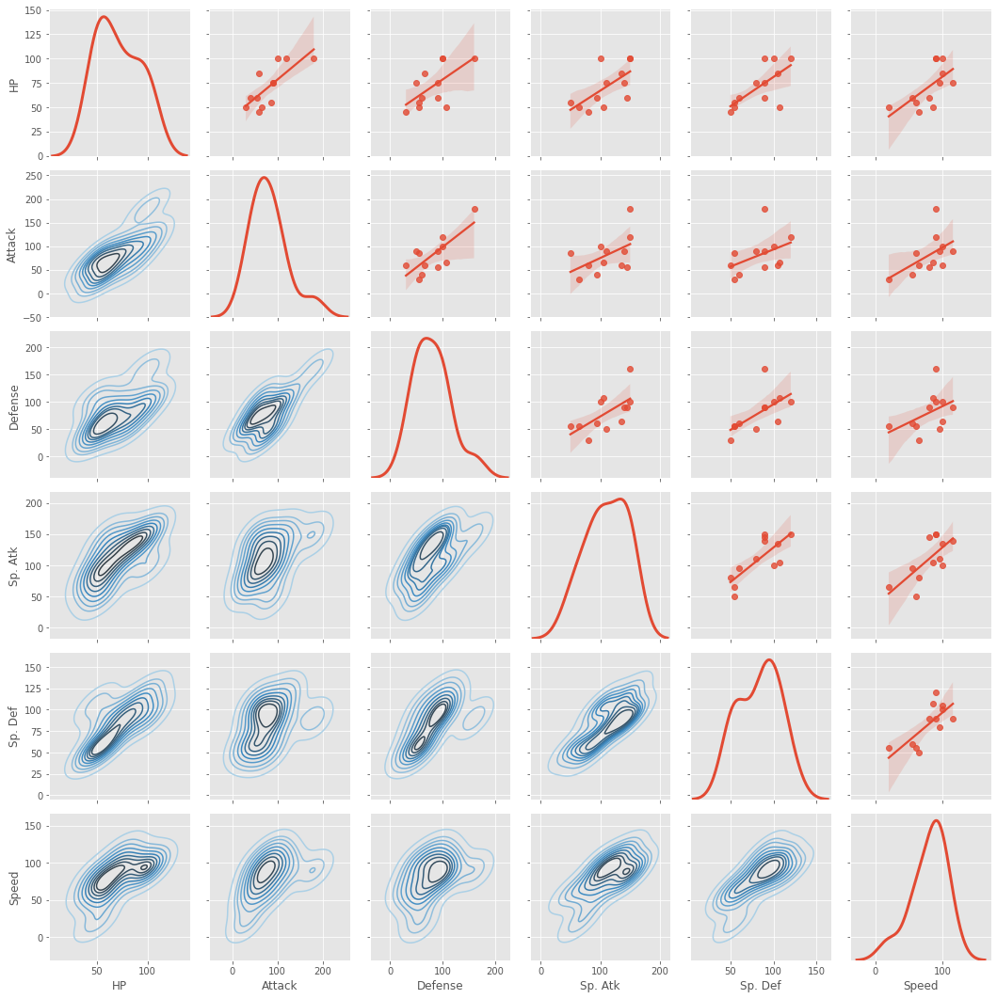

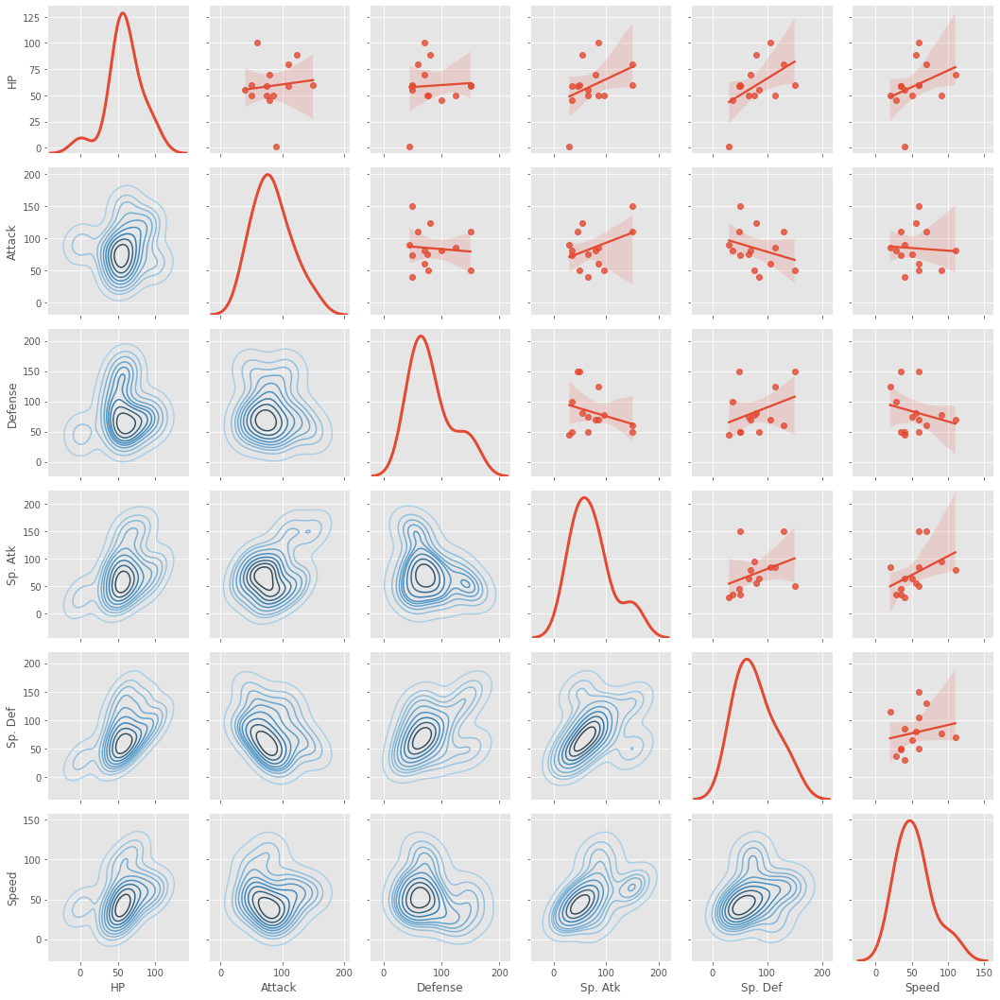

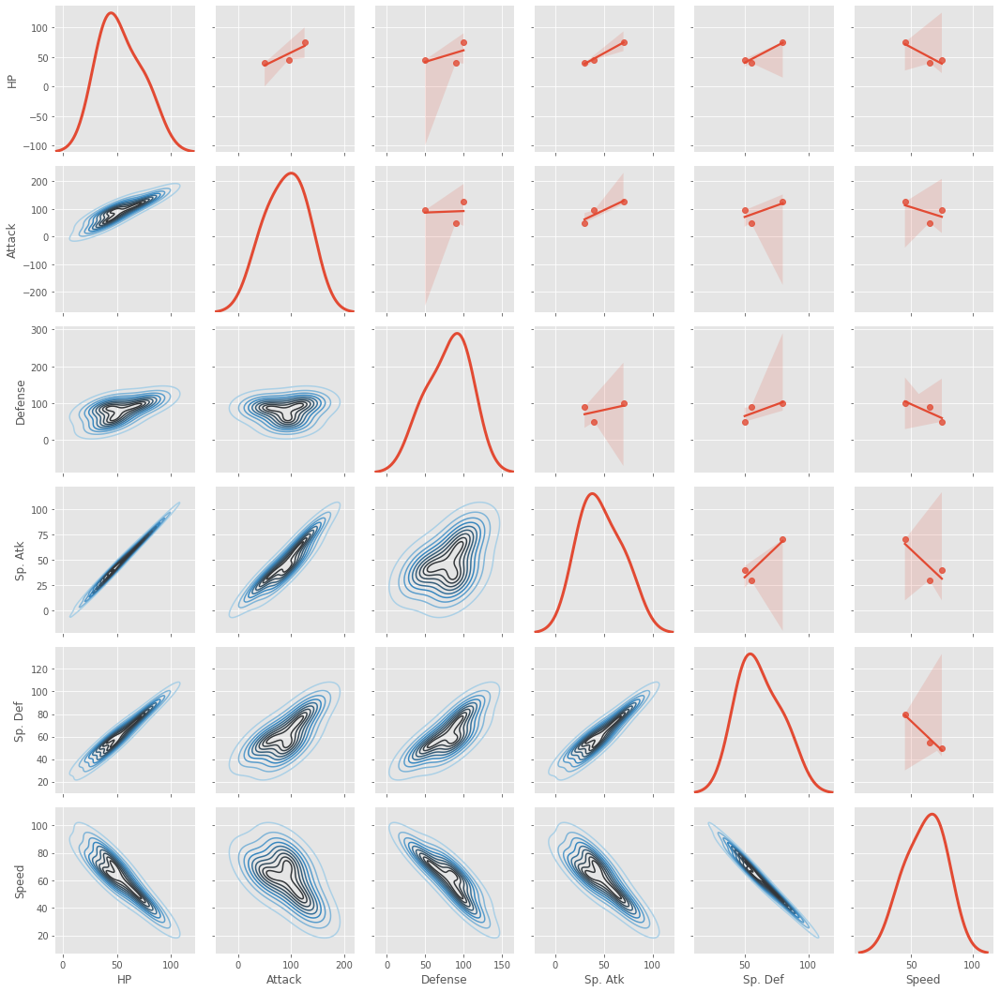

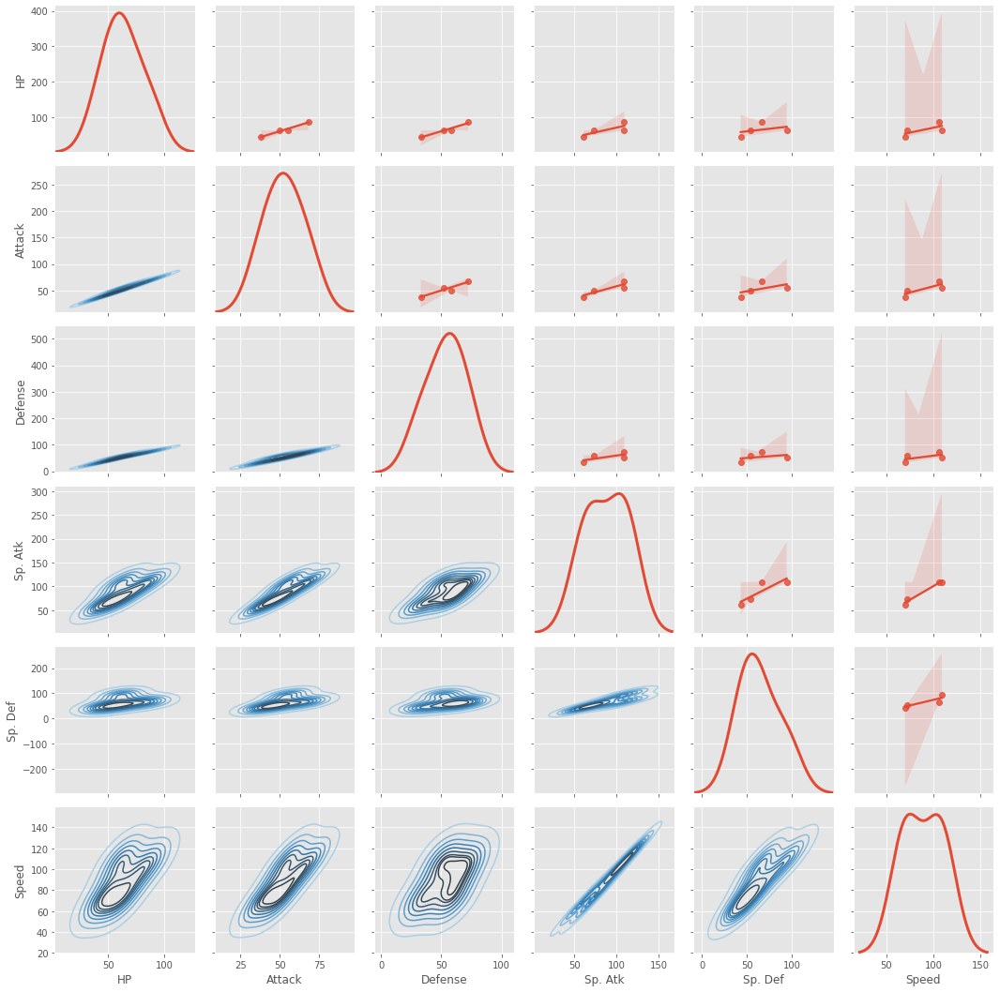

In [ ]:
import matplotlib.pyplot as plt

listOfUniques = df['Type 2'].unique()
print(listOfUniques)
for unique in listOfUniques:
  tempdf = df[ df['Type 2'] == unique]
  g = sns.PairGrid(tempdf.loc[:,col], diag_sharey=False)
  g.map_lower(sns.kdeplot, cmap="Blues_d")
  g.map_upper(sns.regplot)
  g.map_diag(sns.kdeplot, lw=3)

# Majority in Type 2 are Flying however there are only 4 in Type 1

Interesting factor to note
- There are far more Fly Types in Type 2 compared to Type 1
- It looks like in Type 2 in a pokemon it rarely the weaker types like bug or ghost
Due to the lack of more data it is harder to draw more definite conclusions

# **Legendary**

### Seeing how Legendary Pokemon vary with Type

Text(0.5, 1.0, 'Total Pokemon by Type 1')

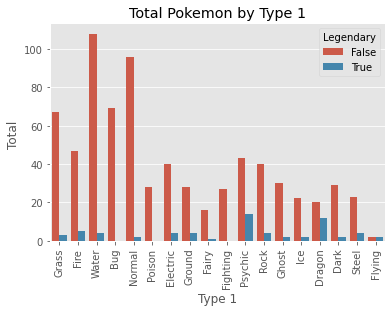

In [ ]:
sns.set_color_codes("pastel")
ax = sns.countplot(x="Type 1", hue="Legendary", data=df)
plt.xticks(rotation= 90)
plt.xlabel('Type 1')
plt.ylabel('Total ')
plt.title("Total Pokemon by Type 1")

- We clearly see that
  - Dragon, Psychic, and Flying have the greatest ration of Legendary to Not Legendary
  - Grass, Fire, Water, Bug, Normal and Poison have the lowest ratio of Legendary to Not Legendary

Text(0.5, 1.0, 'Total Pokemon by Type 2')

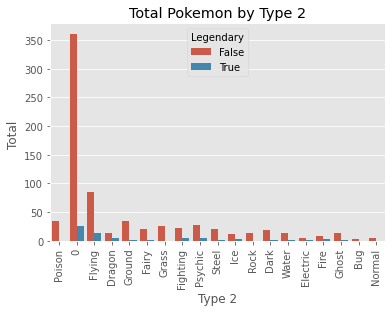

In [ ]:
sns.set_color_codes("pastel")
ax = sns.countplot(x="Type 2", hue="Legendary", data=df)
#f.set_xticklabels(rotation=30)
plt.xticks(rotation= 90)
plt.xlabel('Type 2')
plt.ylabel('Total ')
plt.title("Total Pokemon by Type 2")

- Comparing the number of Pokemon that have no Type 2 with Pokemon that have a Type 2 we observe that those with both Types(Grass, Fire, Water, Bug, Normal and Poison) have a higher change of being legendary,

## Comparing change in values with each passing generation

/usr/local/lib/python3.7/dist-packages/statsmodels/genmod/families/family.py:890: RuntimeWarning: divide by zero encountered in true_divide
  n_endog_mu = self._clean((1. - endog) / (1. - mu))
/usr/local/lib/python3.7/dist-packages/statsmodels/genmod/families/family.py:890: RuntimeWarning: divide by zero encountered in true_divide
  n_endog_mu = self._clean((1. - endog) / (1. - mu))
/usr/local/lib/python3.7/dist-packages/statsmodels/genmod/families/family.py:890: RuntimeWarning: divide by zero encountered in true_divide
  n_endog_mu = self._clean((1. - endog) / (1. - mu))
/usr/local/lib/python3.7/dist-packages/statsmodels/genmod/families/family.py:890: RuntimeWarning: divide by zero encountered in true_divide
  n_endog_mu = self._clean((1. - endog) / (1. - mu))
/usr/local/lib/python3.7/dist-packages/statsmodels/genmod/families/family.py:890: RuntimeWarning: divide by zero encountered in true_divide
  n_endog_mu = self._clean((1. - endog) / (1. - mu))
/usr/local/lib/python3.7/dist-packa

Text(0.5, 1.0, 'Generation vs Sp. Def')

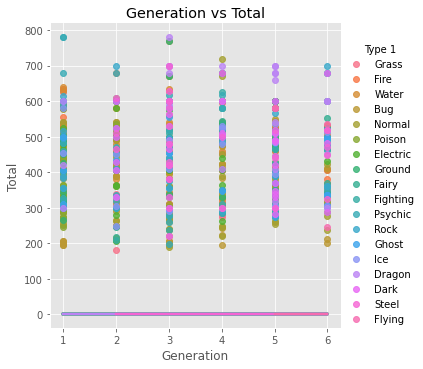

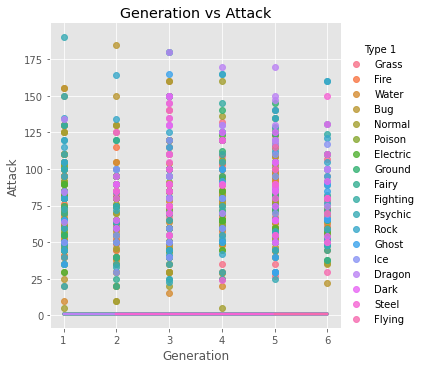

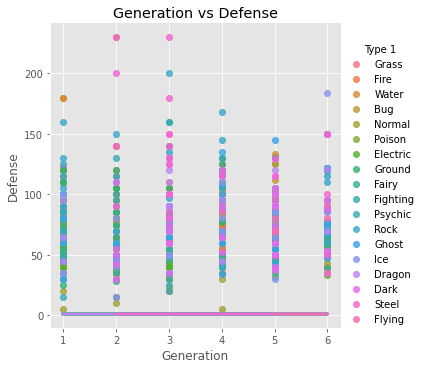

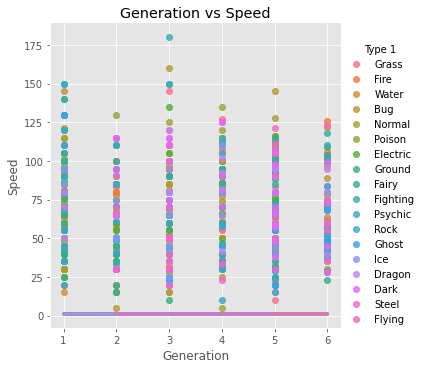

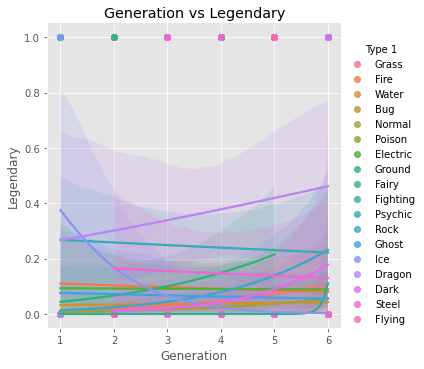

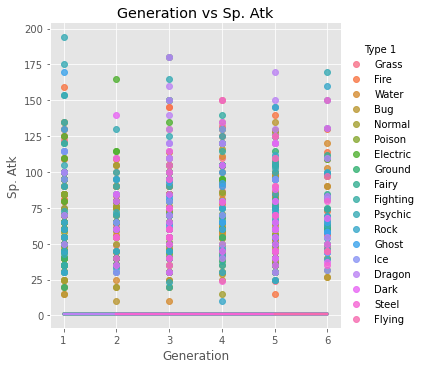

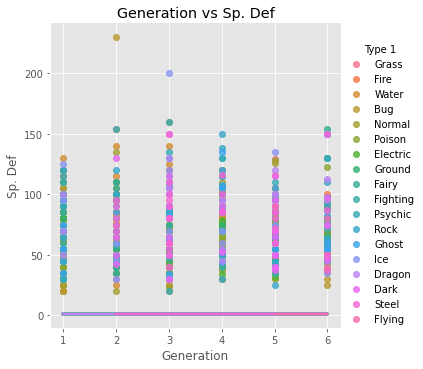

In [ ]:
# changing legendary values from True and False to 1 and 0
df["Legendary"] = df["Legendary"].astype(int)

sns.lmplot(x="Generation", y="Total", data=df, hue = 'Type 1',  logistic=True)
ax = plt.gca()
ax.set_title("Generation vs Total")

sns.lmplot(x="Generation", y="Attack", data=df, hue = 'Type 1',  logistic=True)
ax = plt.gca()
ax.set_title("Generation vs Attack")

sns.lmplot(x="Generation", y="Defense", data=df, hue = 'Type 1',  logistic=True)
ax = plt.gca()
ax.set_title("Generation vs Defense")

sns.lmplot(x="Generation", y="Speed", data=df, hue = 'Type 1',  logistic=True)
ax = plt.gca()
ax.set_title("Generation vs Speed")

sns.lmplot(x="Generation", y="Legendary", data=df, hue = 'Type 1',  logistic=True)
ax = plt.gca()
ax.set_title("Generation vs Legendary")

sns.lmplot(x="Generation", y="Sp. Atk", data=df, hue = 'Type 1',  logistic=True)
ax = plt.gca()
ax.set_title("Generation vs Sp. Atk")

sns.lmplot(x="Generation", y="Sp. Def", data=df, hue = 'Type 1',  logistic=True)
ax = plt.gca()
ax.set_title("Generation vs Sp. Def")

- we see that as each generation progressed there were new types being formed(Dragon, Flying etc)
- overtime the overall values for each column have generally increased, indicating that the pokemon are becoming stronger.
- Average speed of newer generations has also increased, meaning newer generations will get first hit when battling an older generation pokemon of the same caliber.

## Looking at how each type has progressed through each *generation*

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f574d544990>,
      dtype=object)

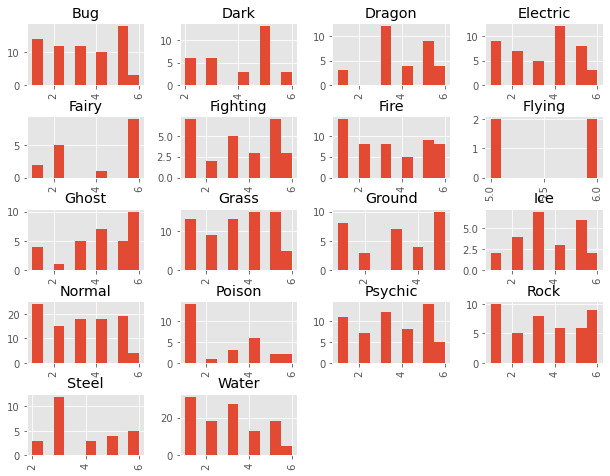

In [ ]:
df.hist(by='Type 1',column='Generation', figsize=[10,8])

- We can clearly see that Flying type has only been Type 1 for 2 generations( 5 and 6)
- Ghost Type has been steadily increasing with it's different variations of pokemon which indicates it could be on its way to become a stronger type
- Fairy seems to create more variations in Pokemon every even generation
- Psychic and Electric show patterns with the number of variations in pokemon they produce each generation

# **CONCLUSIONS**
- ### Notable Points
  - Fire type has had first legendary pokemon in 6th generation, Type 1 is Fire and Type 2 is water, even with completely opposite Types it is still powerful(possibly proves that types work independent of each other on a pokemon)
  - Normal type have been getting stronger but majority lack a type 2 and very few legendary
  - Poison are also creating fewer variations indicating they have probably reached their maximum potential OR the environment they  are in is not suitable for evolution of pokemon
  - for Psychic type it is rare to have a Type 2. Compared to older generations the newer generations are not as strong, this could indicate that their current environment is affecting their ability to achieve their maximum potential
  - Dragon are the most elite type with the highest concentration of legendary pokemons.
    - Dragon type that are legendary are very strong and have high Totals
	    - they come from generation 3, 5, and 6(only one)
	    - they also always come with type 2 common being psychic and Flying
  - Strongest pokemon is MewtwoMega Mewtwo X and MewtwoMega Mewtwo Y(Psychic, Fighting)
  - But Type 1 Dragons dominate the charts eventhough they might not be as powerful as mewtwo
  - Having Type 2 is better as it increases your overall score as now your pokemon has a higher attacks and defenses
  - If your pokemon has only Type 1 but is Legendary then it is at par with a above average pokemon with both types
  - over each generation the number of different legendary pokemons are growing due to evolution
  - Flying has only been Type 1 since the 5th generation, before that from the first generation they have been type 2 which means in a few generations they will have exponentially grown as Type 1
  - The current flying type also have dragon as their Type 2 and are above average, with a few more generations these will surpass the current average types

- ### Final Points
  - When Playing a match avoid basic pokemon(Fire, Water, Bug, Normal, Poison)
  - Go for pokemon with both Type 1 and Type 2 as they increase your chances of winning
  - Pick pokemon that are also legendary
  - Flying type pokemon are soon going to be valuable by the 9th generation(comparing how dragons went from average to supreme from 3rd to 6th), so one should buy them now and start breeding them(Assuming that they are cheap in the current generation). They are a good investment.
  - Due to lack of pokemon fighting data we havent been able to predict whether overall Total OR Type has a greater impact on winning a match. If data is given we will be able to determine it.